In [1]:
%load_ext autoreload
%autoreload 2

import os, sys
import numpy as np
import tensorflow as tf
from sklearn.cluster import KMeans, AgglomerativeClustering, SpectralClustering
from matplotlib import pyplot as plt
from matplotlib.colors import LogNorm

sys.path.insert(1, os.path.join(sys.path[0], ".."))
from reproduction.pipeline.load import load_data
from reproduction import analysis
import sklearn
from scipy.stats import wasserstein_distance

In [14]:
# open/closed cell data dir
CLOSEDATADIR="/home/tkurihana/scratch-midway2/clouds/2017JAN01MOD09GA_close"
CLOSEDS = CLOSEDATADIR+"/closed.tfrecord"
OPENDATADIR="/home/tkurihana/scratch-midway2/clouds/2017JAN01MOD09GA_open"
OPENS = OPENDATADIR+"/open.tfrecord"

# individual/connected cell data dir
INDDATADIR="/home/tkurihana/scratch-midway2/clouds/2017JAN10MOD09GA_intermidiate"
INDS = INDDATADIR+"/individual.tfrecord"
CONDATADIR="/home/tkurihana/scratch-midway2/clouds/2017JAN10MOD09GA_intermidiate"
CONS = CONDATADIR+"/connected.tfrecord"

# outputdata dir
OUTPUTDIR="/project/foster/clouds/output"
CENTERS = OUTPUTDIR+"/mod09cnn15b/encodings/m15b-enc.cluster_centres"
ENCODER_DEF = OUTPUTDIR+"/mod09cnn15b/encoder.json"
ENCODER_WEIGHTS = OUTPUTDIR+"/mod09cnn15b/encoder-585000.h5"
ENCODINGS = OUTPUTDIR+"/mod09cnn15b/encodings/m15b-enc"

In [3]:
centers = analysis.read_kmeans_centers(CENTERS)

In [4]:
k = KMeans(n_clusters=centers.shape[0], init=centers)

In [5]:
with open(ENCODER_DEF,"r") as f:
    encoder = tf.keras.models.model_from_json(f.read())
encoder.load_weights(ENCODER_WEIGHTS)

In [15]:
N=30
opens = analysis.AEData(load_data(OPENS, encoder.input_shape[1:], repeat=False), n=N)
closeds = analysis.AEData(load_data(CLOSEDS, encoder.input_shape[1:], repeat=False), n=N)
inds = analysis.AEData(load_data(INDS, encoder.input_shape[1:], repeat=False), n=N)
cons = analysis.AEData(load_data(CONS, encoder.input_shape[1:], repeat=False), n=N)

In [19]:
opens.add_encoder(encoder)
closeds.add_encoder(encoder)
inds.add_encoder(encoder)
cons.add_encoder(encoder)

In [20]:
#  cluster
k.cluster_centers_ = centers

In [21]:
# Number of Clusters 
num_clusters = 10

In [23]:
# Append
on = np.append(opens.encs,closeds.encs, axis=0)
ic = np.append(inds.encs,cons.encs, axis=0)

In [28]:
both = np.append(on, ic,  axis=0)

In [29]:
method = SpectralClustering(n_clusters=num_clusters, affinity="nearest_neighbors")
clusters = method.fit_predict(both)
o, c, ind, con = clusters[:N], clusters[N:N*2], clusters[N*2:N*3], clusters[N*3:]

# Open vs Closed vs Individual vs Connected

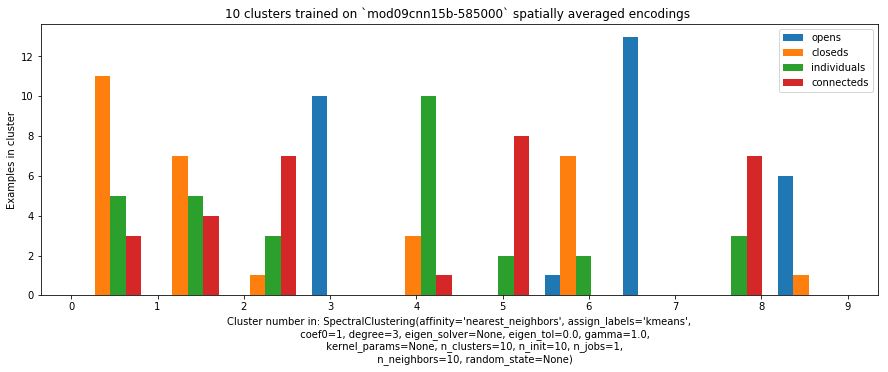

In [30]:
plt.figure(figsize=(15, 5))
plt.hist([o,c,ind, con], bins=num_clusters, label=["opens", "closeds", "individuals", "connecteds"])
plt.xlabel("Cluster number in: "+str(method))
plt.xticks(range(num_clusters))
plt.ylabel("Examples in cluster")
plt.title("%d clusters trained on `mod09cnn15b-585000` spatially averaged encodings "%(num_clusters))
plt.legend()

## N = 4

In [50]:
# Number of Clusters 
num_clusters = 4
method = SpectralClustering(n_clusters=num_clusters, affinity="nearest_neighbors")
clusters = method.fit_predict(both)
o, c, ind, con = clusters[:N], clusters[N:N*2], clusters[N*2:N*3], clusters[N*3:]

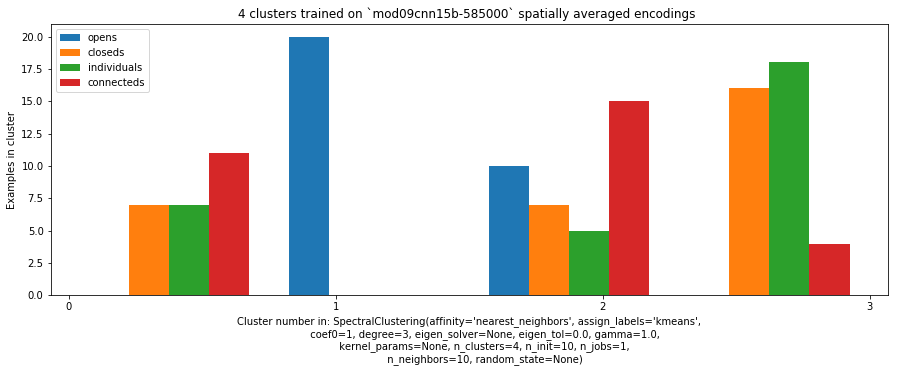

In [51]:
plt.figure(figsize=(15, 5))
plt.hist([o,c,ind, con], bins=num_clusters, label=["opens", "closeds", "individuals", "connecteds"])
plt.xlabel("Cluster number in: "+str(method))
plt.xticks(range(num_clusters))
plt.ylabel("Examples in cluster")
plt.title("%d clusters trained on `mod09cnn15b-585000` spatially averaged encodings "%(num_clusters))
plt.legend()

## Plot neighborhoods

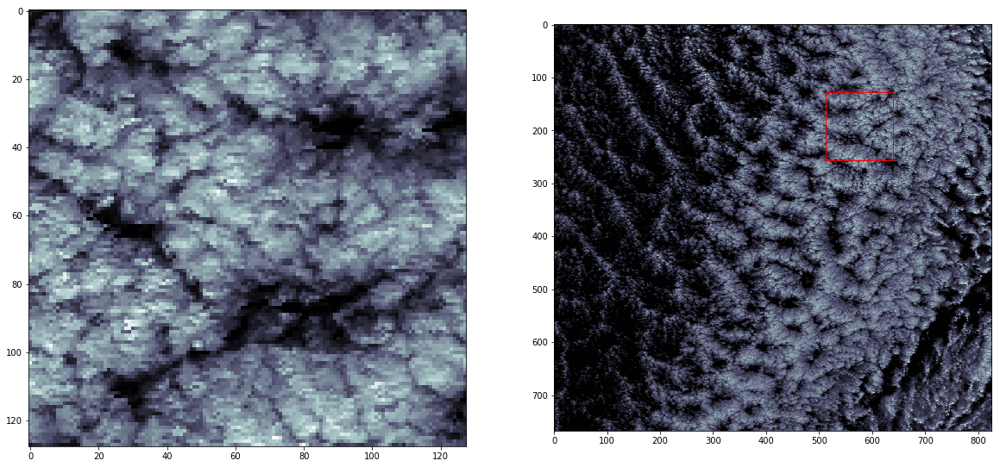

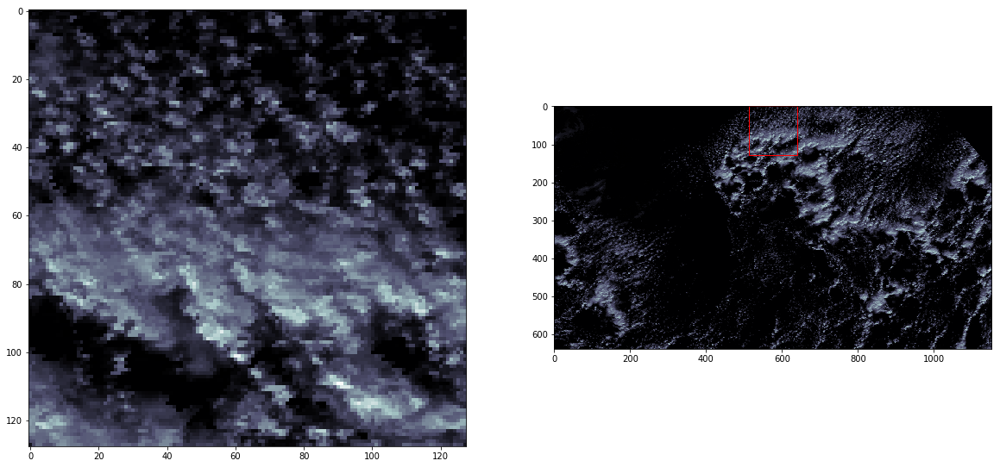

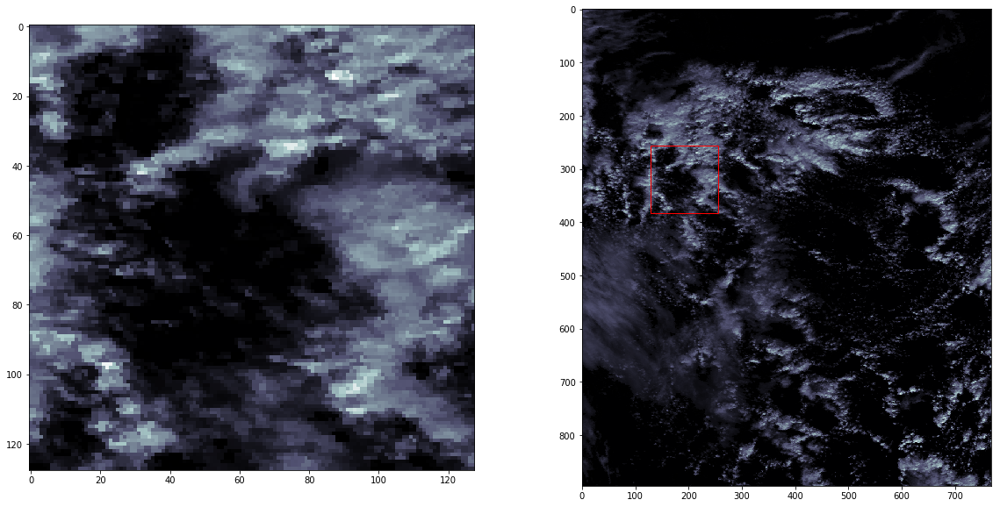

In [53]:
cluster = 0

#i = np.argwhere(o == cluster)[0,0]
j = np.argwhere(c == cluster)[0,0]
k = np.argwhere(ind == cluster)[0,0]
l = np.argwhere(con == cluster)[0,0]

#opens.plot_neighborhood(i,context_width=512)
closeds.plot_neighborhood(j,context_width=512)
inds.plot_neighborhood(k,context_width=512)
cons.plot_neighborhood(l,context_width=512)

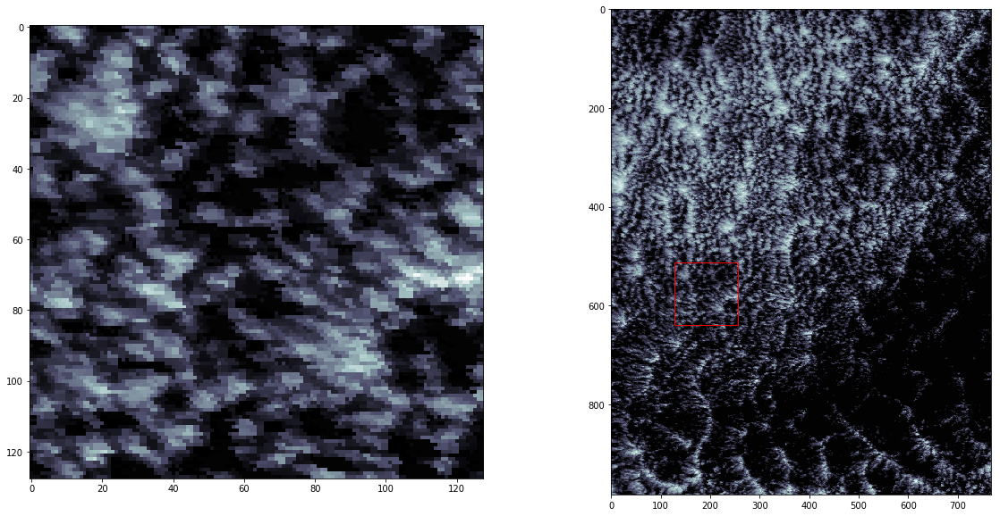

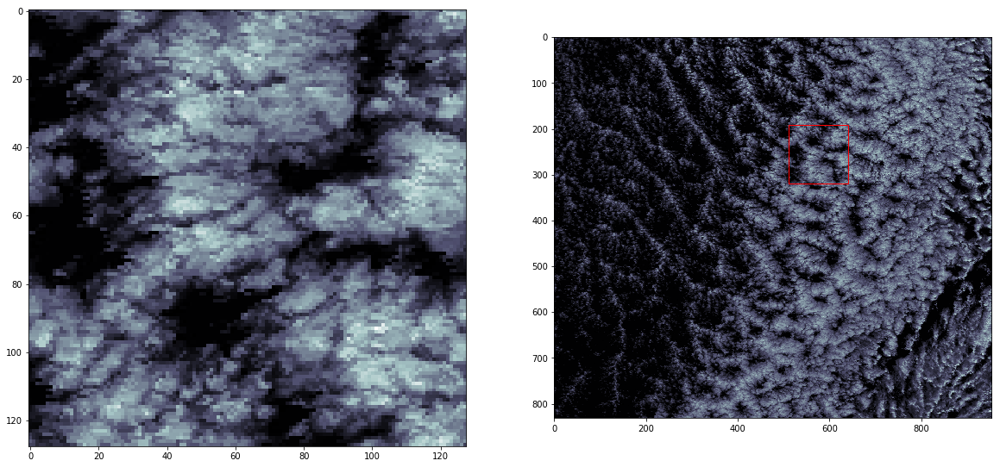

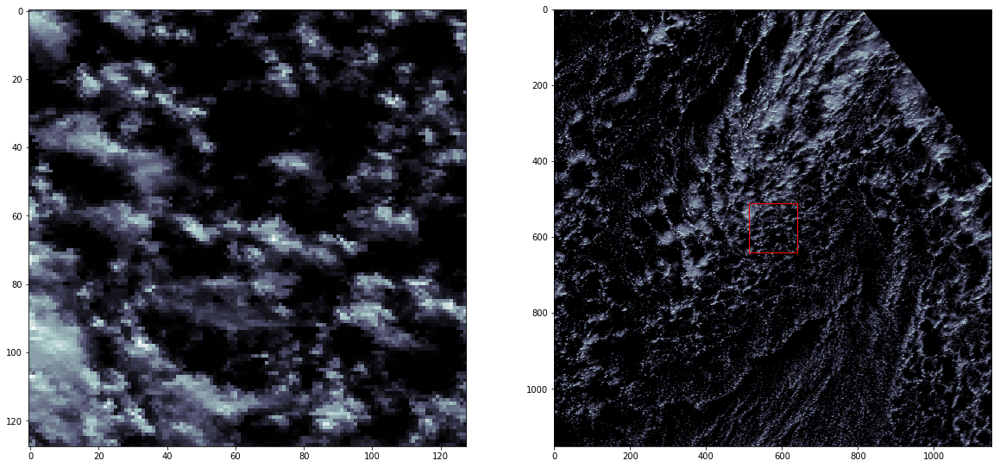

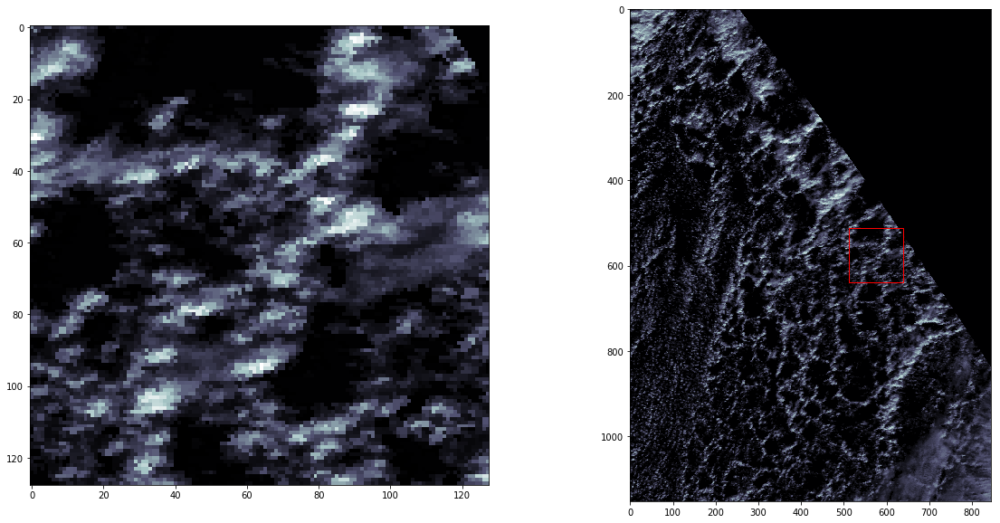

In [52]:
cluster = 2

i = np.argwhere(o == cluster)[0,0]
j = np.argwhere(c == cluster)[0,0]
k = np.argwhere(ind == cluster)[0,0]
l = np.argwhere(con == cluster)[0,0]

opens.plot_neighborhood(i,context_width=512)
closeds.plot_neighborhood(j,context_width=512)
inds.plot_neighborhood(k,context_width=512)
cons.plot_neighborhood(l,context_width=512)

# N = 8

In [33]:
num_clusters = 8
method = SpectralClustering(n_clusters=num_clusters, affinity="nearest_neighbors")
clusters = method.fit_predict(both)
o, c, ind, con = clusters[:N], clusters[N:N*2], clusters[N*2:N*3], clusters[N*3:]

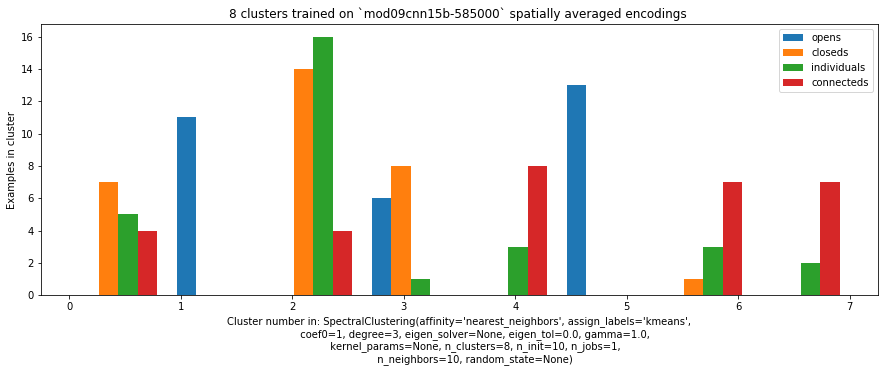

In [34]:
plt.figure(figsize=(15, 5))
plt.hist([o,c,ind, con], bins=num_clusters, label=["opens", "closeds", "individuals", "connecteds"])
plt.xlabel("Cluster number in: "+str(method))
plt.xticks(range(num_clusters))
plt.ylabel("Examples in cluster")
plt.title("%d clusters trained on `mod09cnn15b-585000` spatially averaged encodings "%(num_clusters))
plt.legend()

# N = 12

In [35]:
num_clusters = 12
method = SpectralClustering(n_clusters=num_clusters, affinity="nearest_neighbors")
clusters = method.fit_predict(both)
o, c, ind, con = clusters[:N], clusters[N:N*2], clusters[N*2:N*3], clusters[N*3:]

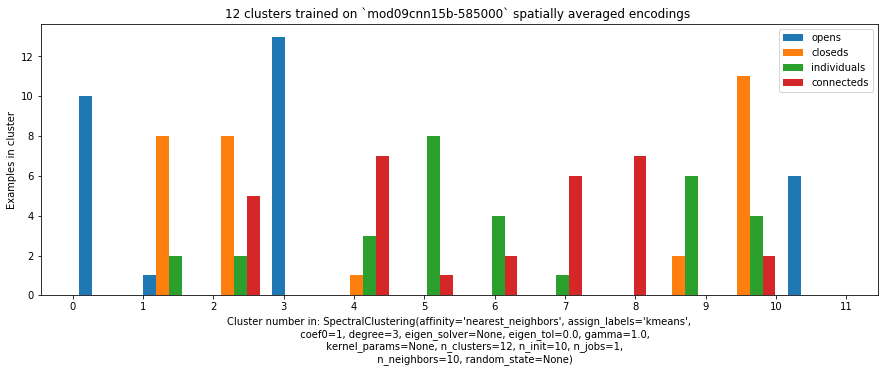

In [36]:
plt.figure(figsize=(15, 5))
plt.hist([o,c,ind, con], bins=num_clusters, label=["opens", "closeds", "individuals", "connecteds"])
plt.xlabel("Cluster number in: "+str(method))
plt.xticks(range(num_clusters))
plt.ylabel("Examples in cluster")
plt.title("%d clusters trained on `mod09cnn15b-585000` spatially averaged encodings "%(num_clusters))
plt.legend()

# N = 16

In [54]:
num_clusters = 16
method = SpectralClustering(n_clusters=num_clusters, affinity="nearest_neighbors")
clusters = method.fit_predict(both)
o, c, ind, con = clusters[:N], clusters[N:N*2], clusters[N*2:N*3], clusters[N*3:]

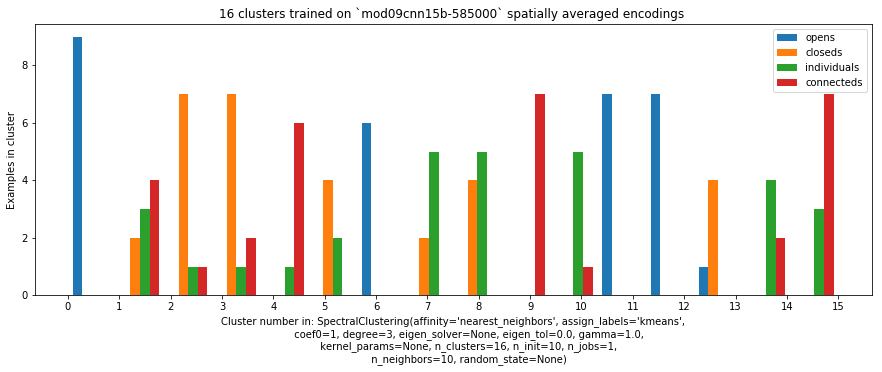

In [55]:
plt.figure(figsize=(15, 5))
plt.hist([o,c,ind, con], bins=num_clusters, label=["opens", "closeds", "individuals", "connecteds"])
plt.xlabel("Cluster number in: "+str(method))
plt.xticks(range(num_clusters))
plt.ylabel("Examples in cluster")
plt.title("%d clusters trained on `mod09cnn15b-585000` spatially averaged encodings "%(num_clusters))
plt.legend()

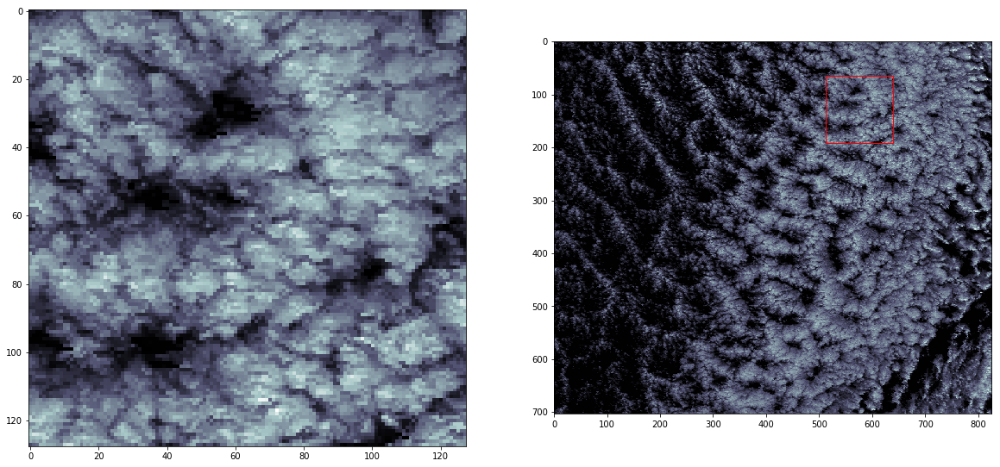

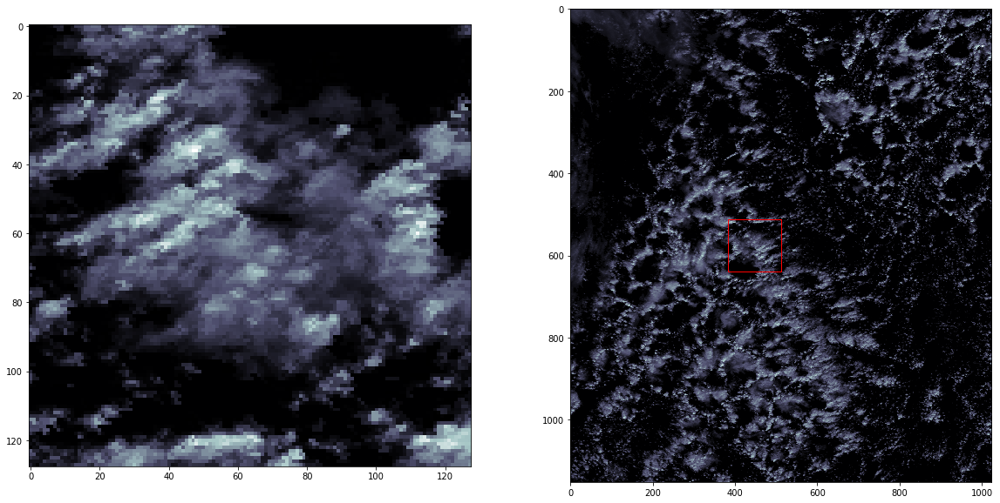

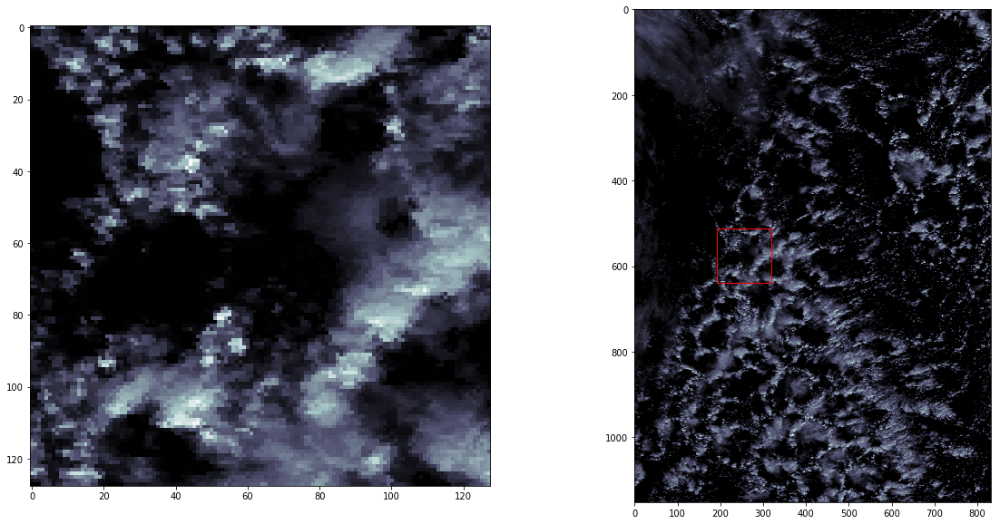

In [56]:
cluster = 1

#i = np.argwhere(o == cluster)[0,0]
j = np.argwhere(c == cluster)[0,0]
k = np.argwhere(ind == cluster)[0,0]
l = np.argwhere(con == cluster)[0,0]

#opens.plot_neighborhood(i,context_width=512)
closeds.plot_neighborhood(j,context_width=512)
inds.plot_neighborhood(k,context_width=512)
cons.plot_neighborhood(l,context_width=512)

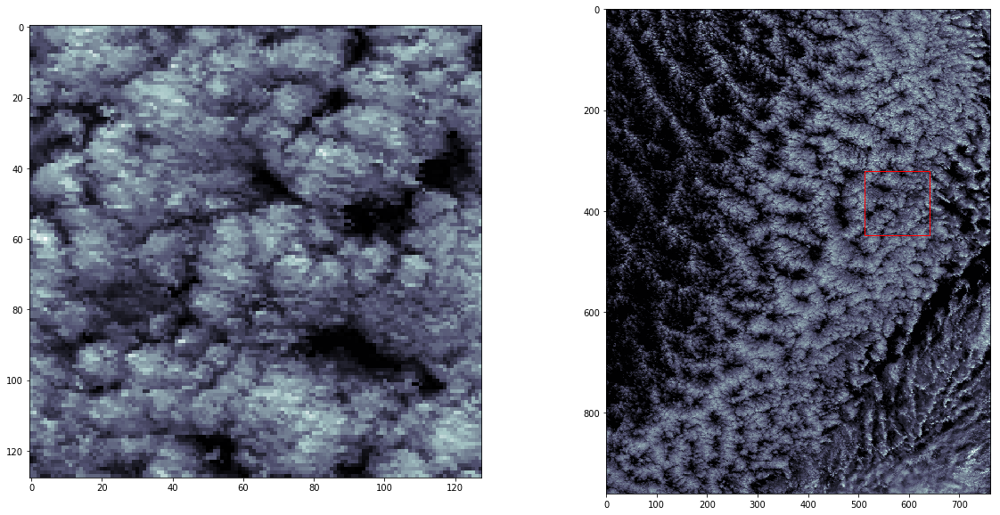

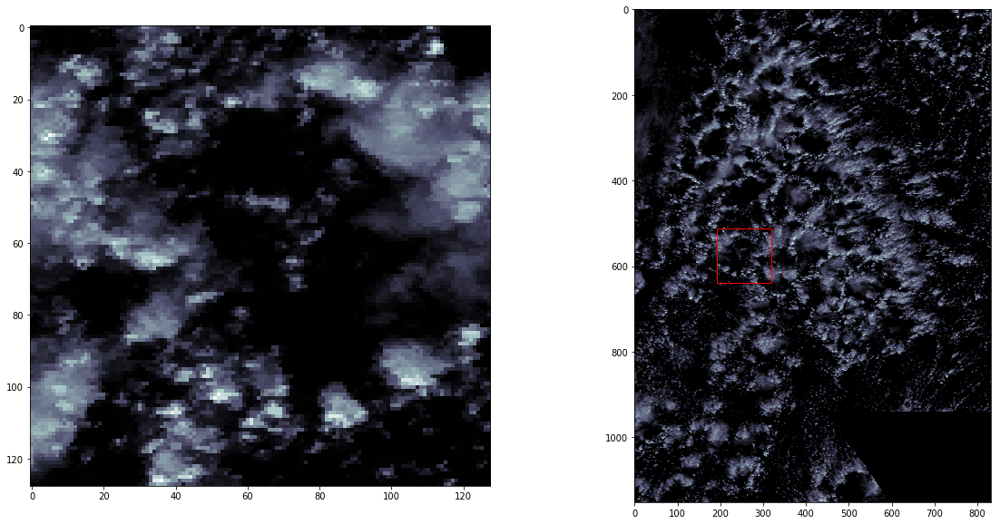

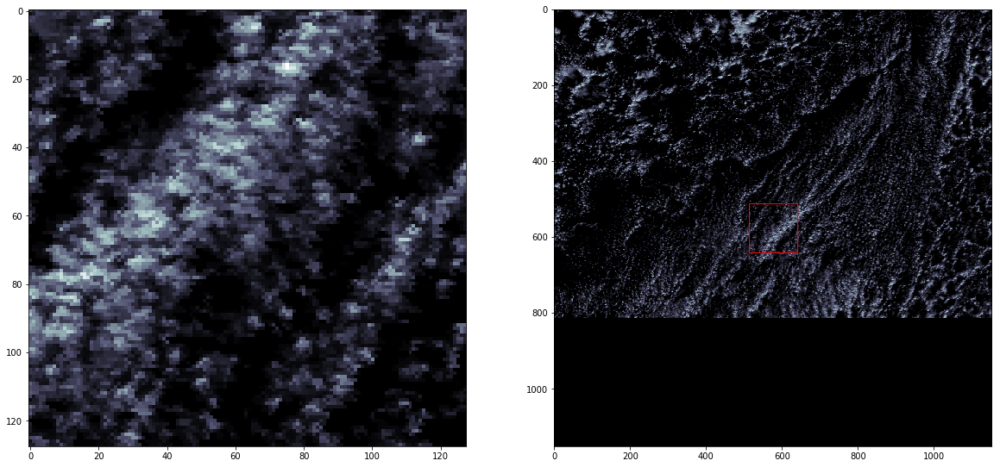

In [57]:
cluster = 3

#i = np.argwhere(o == cluster)[0,0]
j = np.argwhere(c == cluster)[0,0]
k = np.argwhere(ind == cluster)[0,0]
l = np.argwhere(con == cluster)[0,0]

#opens.plot_neighborhood(i,context_width=512)
closeds.plot_neighborhood(j,context_width=512)
inds.plot_neighborhood(k,context_width=512)
cons.plot_neighborhood(l,context_width=512)

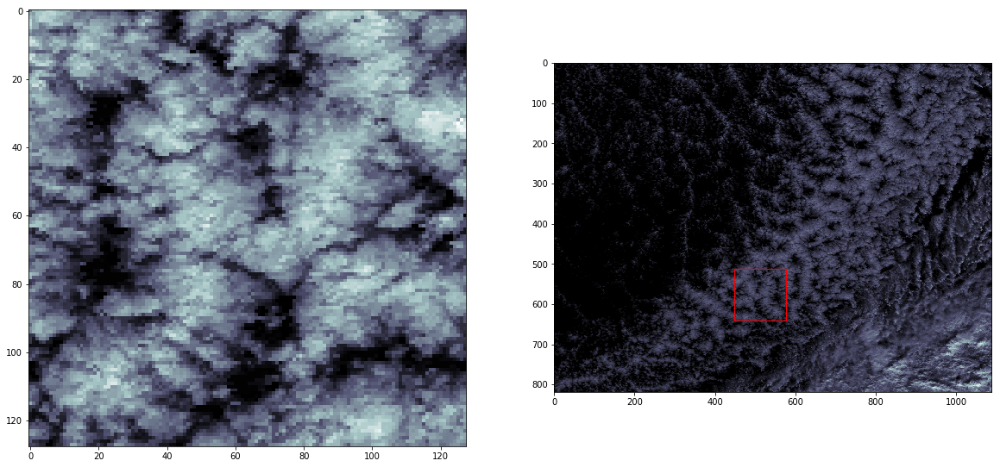

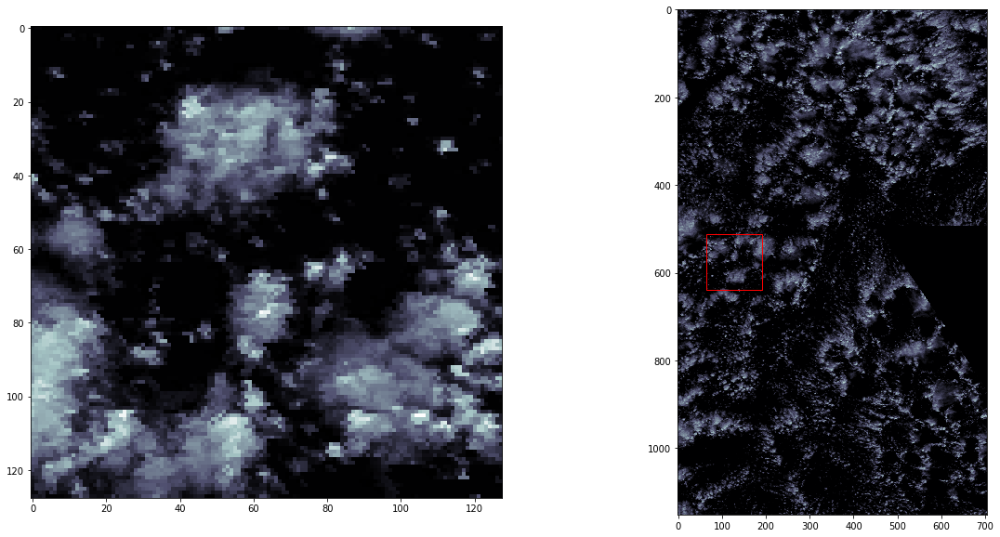

In [59]:
cluster = 7

#i = np.argwhere(o == cluster)[0,0]
j = np.argwhere(c == cluster)[0,0]
k = np.argwhere(ind == cluster)[0,0]
#l = np.argwhere(con == cluster)[0,0]

#opens.plot_neighborhood(i,context_width=512)
closeds.plot_neighborhood(j,context_width=512)
inds.plot_neighborhood(k,context_width=512)
#cons.plot_neighborhood(l,context_width=512)

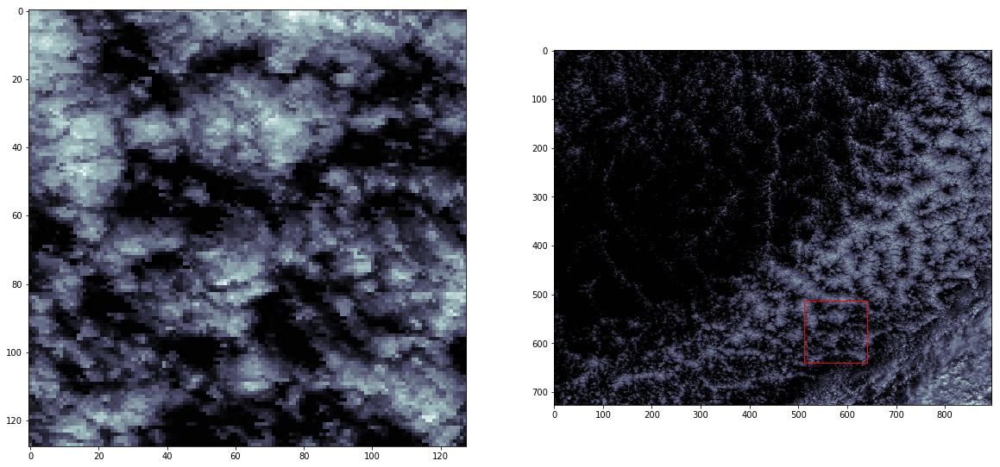

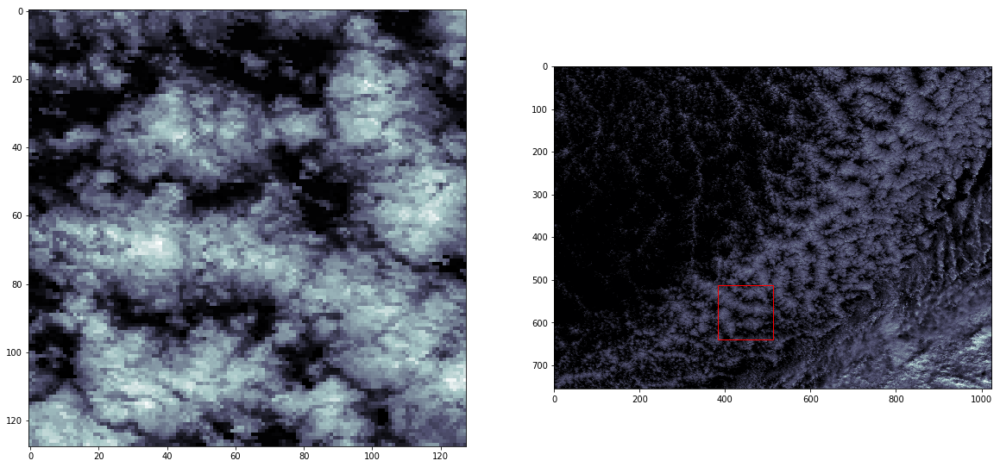

In [60]:
cluster = 13

i = np.argwhere(o == cluster)[0,0]
j = np.argwhere(c == cluster)[0,0]

opens.plot_neighborhood(i,context_width=512)
closeds.plot_neighborhood(j,context_width=512)

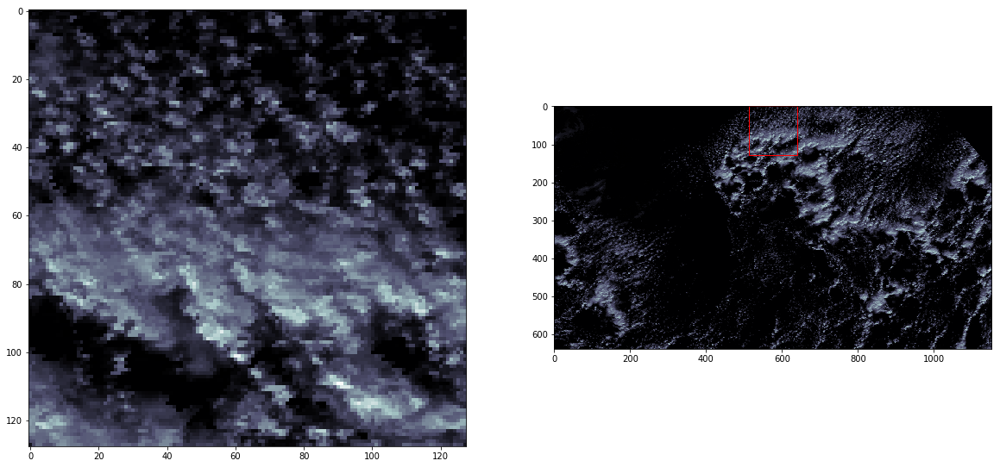

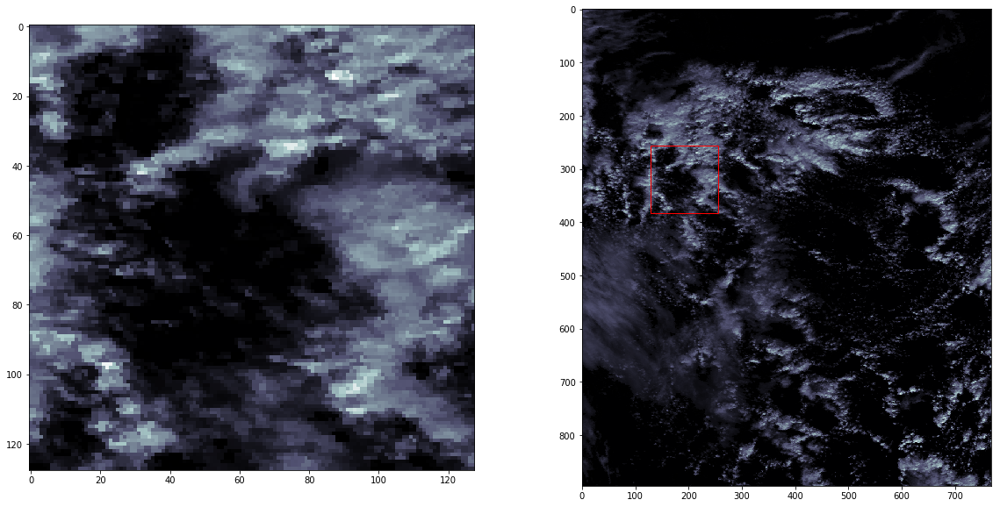

In [61]:
cluster = 15

#i = np.argwhere(o == cluster)[0,0]
#j = np.argwhere(c == cluster)[0,0]
k = np.argwhere(ind == cluster)[0,0]
l = np.argwhere(con == cluster)[0,0]

#opens.plot_neighborhood(i,context_width=512)
#closeds.plot_neighborhood(j,context_width=512)
inds.plot_neighborhood(k,context_width=512)
cons.plot_neighborhood(l,context_width=512)

# N = 20

In [42]:
num_clusters = 20
method = SpectralClustering(n_clusters=num_clusters, affinity="nearest_neighbors")
clusters = method.fit_predict(both)
o, c, ind, con = clusters[:N], clusters[N:N*2], clusters[N*2:N*3], clusters[N*3:]

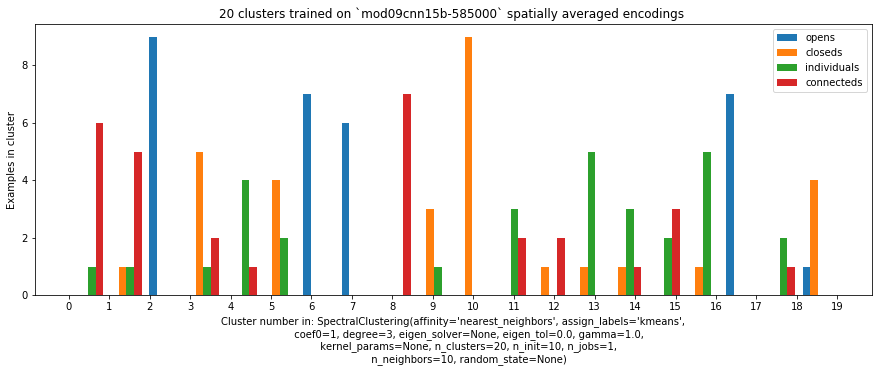

In [43]:
plt.figure(figsize=(15, 5))
plt.hist([o,c,ind, con], bins=num_clusters, label=["opens", "closeds", "individuals", "connecteds"])
plt.xlabel("Cluster number in: "+str(method))
plt.xticks(range(num_clusters))
plt.ylabel("Examples in cluster")
plt.title("%d clusters trained on `mod09cnn15b-585000` spatially averaged encodings "%(num_clusters))
plt.legend()

# N = 24

In [44]:
num_clusters = 24
method = SpectralClustering(n_clusters=num_clusters, affinity="nearest_neighbors")
clusters = method.fit_predict(both)
o, c, ind, con = clusters[:N], clusters[N:N*2], clusters[N*2:N*3], clusters[N*3:]

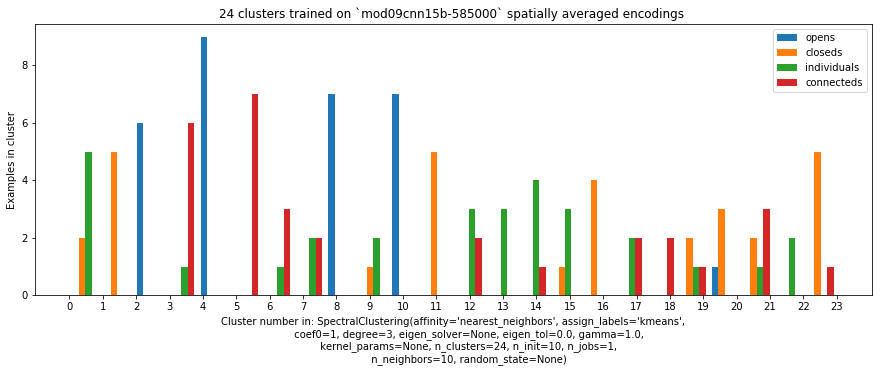

In [45]:
plt.figure(figsize=(15, 5))
plt.hist([o,c,ind, con], bins=num_clusters, label=["opens", "closeds", "individuals", "connecteds"])
plt.xlabel("Cluster number in: "+str(method))
plt.xticks(range(num_clusters))
plt.ylabel("Examples in cluster")
plt.title("%d clusters trained on `mod09cnn15b-585000` spatially averaged encodings "%(num_clusters))
plt.legend()

# N = 25

In [48]:
num_clusters = 25
method = SpectralClustering(n_clusters=num_clusters, affinity="nearest_neighbors")
clusters = method.fit_predict(both)
o, c, ind, con = clusters[:N], clusters[N:N*2], clusters[N*2:N*3], clusters[N*3:]

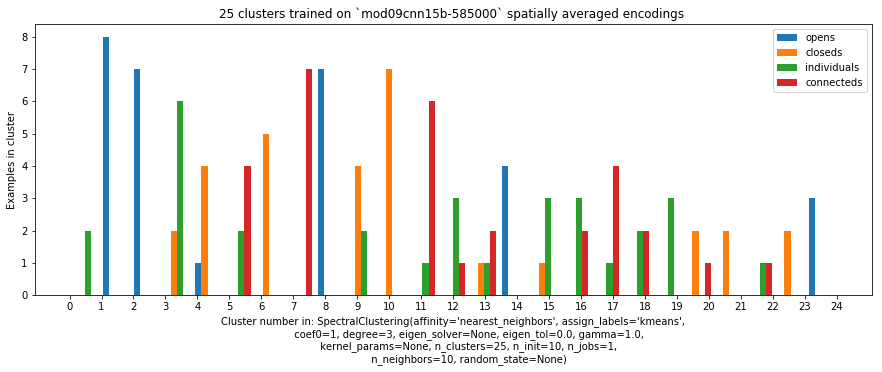

In [49]:
plt.figure(figsize=(15, 5))
plt.hist([o,c,ind, con], bins=num_clusters, label=["opens", "closeds", "individuals", "connecteds"])
plt.xlabel("Cluster number in: "+str(method))
plt.xticks(range(num_clusters))
plt.ylabel("Examples in cluster")
plt.title("%d clusters trained on `mod09cnn15b-585000` spatially averaged encodings "%(num_clusters))
plt.legend()